In [9]:
import numpy as np
import pandas as pd 
import xgboost as xgb
import matplotlib.pyplot as plt
import pickle
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.sandbox.regression.predstd import wls_prediction_std
import datetime
import xlrd
import os
import re
from scipy.stats import kstest
from scipy.spatial.distance import directed_hausdorff
from scipy import optimize
import pwlf
from scipy.optimize import minimize
from pyecharts import options as opts
from pyecharts.charts import Calendar
from matplotlib.ticker import FuncFormatter
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import math
from sklearn.exceptions import ConvergenceWarning
import warnings
import contextlib
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_pacf,plot_acf
from sklearn import svm
warnings.filterwarnings("ignore")

In [2]:
# load day ahead price data from E:\day-ahead price\Data\ISO_New_England\day_ahead_price
path = r'E:\day-ahead price\Data\ISO_New_England\day_ahead_price'
os.chdir(path)
files = os.listdir(path)
df = pd.DataFrame()
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    # print(df_tmp)
    df = pd.concat([df, df_tmp])
df.columns = df.iloc[4]
df = df[df['H'] == 'D'].drop(['H'], axis = 1).reset_index(drop = True)
# average price by Date and Hour Ending
tmp = []
df['Hour Ending'] = df['Hour Ending'].astype(str)
df['Date'] = pd.to_datetime(df['Date'])
df['Date'] = df['Date'].dt.strftime('%Y-%m-%d')
df['Locational Marginal Price'] = df['Locational Marginal Price'].astype(float)
df['Energy Component'] = df['Energy Component'].astype(float)
df['Congestion Component'] = df['Congestion Component'].astype(float)
df['Marginal Loss Component'] = df['Marginal Loss Component'].astype(float)
df_group = df.groupby(['Date', 'Hour Ending'])
for [Date, Hour_Ending], group in df_group:
    Locational_Marginal_Price = group['Locational Marginal Price'].mean() 
    Energy_Component = group['Energy Component'].mean()
    Congestion_Component = group['Congestion Component'].mean()
    Marginal_Loss_Component = group['Marginal Loss Component'].mean()
    tmp.append([Date, Hour_Ending, Locational_Marginal_Price, Energy_Component, Congestion_Component, Marginal_Loss_Component])
df_price = pd.DataFrame(tmp, columns = ['Date', 'Hour Ending', 'Locational Marginal Price', 'Energy Component', 'Congestion Component', 'Marginal Loss Component'])
df_price

,Date,Hour Ending,Locational Marginal Price,Energy Component,Congestion Component,Marginal Loss Component
0,2023-01-01,01,31.089169,31.28,0.000000,-0.190831
1,2023-01-01,02,28.274745,28.44,0.000000,-0.165255
2,2023-01-01,03,26.674071,26.83,0.000000,-0.155929
3,2023-01-01,04,28.031077,28.19,0.000000,-0.158923
4,2023-01-01,05,29.541431,29.70,0.000000,-0.158569
...,...,...,...,...,...,...
7555,2023-11-11,20,40.609046,40.90,-0.030929,-0.260025
7556,2023-11-11,21,40.179589,40.43,-0.028840,-0.221571
7557,2023-11-11,22,39.871406,40.09,-0.032385,-0.186209
7558,2023-11-11,23,29.190831,29.34,-0.002179,-0.146990


In [3]:
# df_price lack a line of data in Date 2023-03-12, Hour Ending 3, so we need to add this line by average of Hour Ending 2 and Hour Ending 4
lost_data = pd.DataFrame({'Date': '2023-03-12', 'Hour Ending': '03', 'Locational Marginal Price': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Locational Marginal Price'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Locational Marginal Price'].values[0])/2, 'Energy Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Energy Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Energy Component'].values[0])/2, 'Congestion Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Congestion Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Congestion Component'].values[0])/2, 'Marginal Loss Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Marginal Loss Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Marginal Loss Component'].values[0])/2}, index = [0])
df_price = pd.concat([df_price, lost_data]).sort_values(by = ['Date', 'Hour Ending']).reset_index(drop = True)
# delete the line of data in Date 2023-11-05, whose Hour Ending = '02X' 
df_price = df_price.drop(df_price[(df_price['Date'] == '2023-11-05') & (df_price['Hour Ending'] == '02X')].index).reset_index(drop = True)
df_price['Hour Ending'] = df_price['Hour Ending'].astype(int)
df_price

,Date,Hour Ending,Locational Marginal Price,Energy Component,Congestion Component,Marginal Loss Component
0,2023-01-01,1,31.089169,31.28,0.000000,-0.190831
1,2023-01-01,2,28.274745,28.44,0.000000,-0.165255
2,2023-01-01,3,26.674071,26.83,0.000000,-0.155929
3,2023-01-01,4,28.031077,28.19,0.000000,-0.158923
4,2023-01-01,5,29.541431,29.70,0.000000,-0.158569
...,...,...,...,...,...,...
7555,2023-11-11,20,40.609046,40.90,-0.030929,-0.260025
7556,2023-11-11,21,40.179589,40.43,-0.028840,-0.221571
7557,2023-11-11,22,39.871406,40.09,-0.032385,-0.186209
7558,2023-11-11,23,29.190831,29.34,-0.002179,-0.146990


In [4]:
# load forecast load data from E:\day-ahead price\Data\ISO_New_England\forecast_load
path = r'E:\day-ahead price\Data\ISO_New_England\forecast_load'
os.chdir(path)
files = os.listdir(path)
tmp1 = []
tmp2 = []
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    # print(df_tmp)
    df_tmp.columns = df_tmp.iloc[4]
    df_tmp = df_tmp.iloc[6:]
    df_tmp = df_tmp[df_tmp['H'] == 'D'].drop(['H'], axis=1).reset_index(drop=True)
    df_tmp['Published Date'] = pd.to_datetime(df_tmp['Published Date'])
    df_tmp['Forecast Date'] = pd.to_datetime(df_tmp['Forecast Date'])
    df_tmp['Published Day'] = df_tmp['Published Date'].dt.strftime('%Y-%m-%d')
    df_tmp['Published Day'] = pd.to_datetime(df_tmp['Published Day'])
    df_tmp['delta'] = df_tmp['Forecast Date'] - df_tmp['Published Day']
    df_tmp['MW'] = df_tmp['MW'].astype(float)
    df_tmp['%'] = df_tmp['%'].astype(float)
    df_tmp1 = df_tmp[df_tmp['delta'] == datetime.timedelta(1)].reset_index(drop=True)
    df_tmp2 = df_tmp[df_tmp['delta'] == datetime.timedelta(2)].reset_index(drop=True)
    df_tmp1.drop_duplicates(subset=['Forecast Date', 'Hour', 'Reliability Region'], keep='first', inplace=True)
    df_tmp2.drop_duplicates(subset=['Forecast Date', 'Hour', 'Reliability Region'], keep='first', inplace=True)
    df_group1 = df_tmp1.groupby(['Forecast Date', 'Hour'])
    
    for [Forecast_Date, Hour], group in df_group1:
        Load = group['MW'].sum()
        percent = group['%'].sum()
        if percent > 90:
            tmp1.append([Forecast_Date, Hour, Load])
    df_group2 = df_tmp2.groupby(['Forecast Date', 'Hour'])
    for [Forecast_Date, Hour], group in df_group2:
        Load = group['MW'].sum()
        percent = group['%'].sum()
        if percent > 90:
            tmp2.append([Forecast_Date, Hour, Load])
df_load_pred_D1 = pd.DataFrame(tmp1, columns=['Forecast Date', 'Hour', 'Load(MW)'])
df_load_pred_D2 = pd.DataFrame(tmp2, columns=['Forecast Date', 'Hour', 'Load(MW)'])
df_load_pred_D1['Date'] = df_load_pred_D1['Forecast Date']
df_load_pred_D2['Date'] = df_load_pred_D2['Forecast Date']
df_load_pred_D1 = df_load_pred_D1[df_load_pred_D1['Hour'] != '02X']
df_load_pred_D2 = df_load_pred_D2[df_load_pred_D2['Hour'] != '02X']
df_load_pred_D1['Hour Ending'] = df_load_pred_D1['Hour'].astype(int)
df_load_pred_D2['Hour Ending'] = df_load_pred_D2['Hour'].astype(int)
df_load_pred_D1

,Forecast Date,Hour,Load(MW),Date,Hour Ending
0,2023-01-01,01,10270.001,2023-01-01,1
1,2023-01-01,02,9860.000,2023-01-01,2
2,2023-01-01,03,9590.001,2023-01-01,3
3,2023-01-01,04,9420.001,2023-01-01,4
4,2023-01-01,05,9390.002,2023-01-01,5
...,...,...,...,...,...
7555,2023-11-11,20,13819.999,2023-11-11,20
7556,2023-11-11,21,13249.999,2023-11-11,21
7557,2023-11-11,22,12730.000,2023-11-11,22
7558,2023-11-11,23,12020.000,2023-11-11,23


In [5]:
# df_load_pred_D1 lack a line of data in Date 2023-03-12, Hour Ending 3, so we need to add this line by average of Hour Ending 2 and Hour Ending 4
df_tmp = df_load_pred_D1[(df_load_pred_D1['Date'] == '2023-03-12') & (df_load_pred_D1['Hour'] == '02')].reset_index(drop=True)
df_tmp['Hour'] = 3
df_tmp['Load(MW)'] = (df_load_pred_D1[(df_load_pred_D1['Date'] == '2023-03-12') & (df_load_pred_D1['Hour'] == '02')]['Load(MW)'].values + df_load_pred_D1[(df_load_pred_D1['Date'] == '2023-03-12') & (df_load_pred_D1['Hour'] == '04')]['Load(MW)'].values) / 2
df_load_pred_D1 = pd.concat([df_load_pred_D1, df_tmp], axis=0).reset_index(drop=True).sort_values(by=['Date', 'Hour']).reset_index(drop=True)
df_load_pred_D1

,Forecast Date,Hour,Load(MW),Date,Hour Ending
0,2023-01-01,01,10270.001,2023-01-01,1
1,2023-01-01,02,9860.000,2023-01-01,2
2,2023-01-01,03,9590.001,2023-01-01,3
3,2023-01-01,04,9420.001,2023-01-01,4
4,2023-01-01,05,9390.002,2023-01-01,5
...,...,...,...,...,...
7555,2023-11-11,20,13819.999,2023-11-11,20
7556,2023-11-11,21,13249.999,2023-11-11,21
7557,2023-11-11,22,12730.000,2023-11-11,22
7558,2023-11-11,23,12020.000,2023-11-11,23


In [6]:
# load forecast wind data from E:\day-ahead price\Data\ISO_New_England\forecast_wind
path = r'E:\day-ahead price\Data\ISO_New_England\forecast_wind'
os.chdir(path)
files = os.listdir(path)
df1 = pd.DataFrame()
df2 = pd.DataFrame()
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    df_tmp = df_tmp.iloc[6:31, 2:6].T.reset_index(drop=True)
    df_tmp.columns = df_tmp.iloc[0]
    df1 = pd.concat([df1, df_tmp.iloc[2, :]], axis=1)
    df2 = pd.concat([df2, df_tmp.iloc[3, :]], axis=1)     
df1 = df1.T
df2 = df2.T
df_wind_pred_D1 = df1.drop(['02X'], axis=1)
df_wind_pred_D2 = df2.drop(['02X'], axis=1)
df_tmp = pd.DataFrame()
for line_index in range(0, len(df_wind_pred_D1)):
    line = df_wind_pred_D1.iloc[line_index, :]
    date = df_wind_pred_D1.iloc[line_index, 0]
    line = pd.DataFrame(line).reset_index()
    line.columns = ['Hour Ending', 'Wind(MW)']
    line['Date'] = date
    line = line.iloc[1:, :]
    df_tmp = pd.concat([df_tmp, line], axis=0)
df_wind_pred_D1 = df_tmp.reset_index(drop=True)
df_tmp = pd.DataFrame()
for line_index in range(0, len(df_wind_pred_D2)):
    line = df_wind_pred_D2.iloc[line_index, :]
    date = df_wind_pred_D2.iloc[line_index, 0]
    line = pd.DataFrame(line).reset_index()
    line.columns = ['Hour Ending', 'Wind(MW)']
    line['Date'] = date
    line = line.iloc[1:, :]
    df_tmp = pd.concat([df_tmp, line], axis=0)
df_wind_pred_D2 = df_tmp.reset_index(drop=True)
df_wind_pred_D1['Hour Ending'] = df_wind_pred_D1['Hour Ending'].astype(int)
df_wind_pred_D2['Hour Ending'] = df_wind_pred_D2['Hour Ending'].astype(int)
df_wind_pred_D1['Date'] = pd.to_datetime(df_wind_pred_D1['Date'])
df_wind_pred_D2['Date'] = pd.to_datetime(df_wind_pred_D2['Date'])
df_wind_pred_D1['Wind(MW)'] = df_wind_pred_D1['Wind(MW)'].astype(float)
df_wind_pred_D2['Wind(MW)'] = df_wind_pred_D2['Wind(MW)'].astype(float)
df_wind_pred_D1

,Hour Ending,Wind(MW),Date
0,1,399.0,2023-01-02
1,2,387.0,2023-01-02
2,3,347.0,2023-01-02
3,4,319.0,2023-01-02
4,5,292.0,2023-01-02
...,...,...,...
7555,20,289.0,2023-11-12
7556,21,253.0,2023-11-12
7557,22,238.0,2023-11-12
7558,23,217.0,2023-11-12


In [7]:
# df_wind_pred_D1 is nan of data in Date 2023-03-12, Hour Ending 2, so we need to replace this data by average of Hour Ending 3 and Hour Ending 1
tmp_wind = (df_wind_pred_D1[(df_wind_pred_D1['Date'] == '2023-03-12') & (df_wind_pred_D1['Hour Ending'] == 3)]['Wind(MW)'].values + df_wind_pred_D1[(df_wind_pred_D1['Date'] == '2023-03-12') & (df_wind_pred_D1['Hour Ending'] == 1)]['Wind(MW)'].values) / 2
df_wind_pred_D1.loc[(df_wind_pred_D1['Date'] == '2023-03-12') & (df_wind_pred_D1['Hour Ending'] == 2), 'Wind(MW)'] = tmp_wind
df_wind_pred_D1


,Hour Ending,Wind(MW),Date
0,1,399.0,2023-01-02
1,2,387.0,2023-01-02
2,3,347.0,2023-01-02
3,4,319.0,2023-01-02
4,5,292.0,2023-01-02
...,...,...,...
7555,20,289.0,2023-11-12
7556,21,253.0,2023-11-12
7557,22,238.0,2023-11-12
7558,23,217.0,2023-11-12


In [8]:
def loss(target, prediction):
    if np.isnan(target).all() or np.isnan(prediction).all():
        return 0, 0, 0, 0
    from math import sqrt
    error = []
    pError = []
    for i in range(len(target)):
        error.append(target[i] - prediction[i])
        
        # if target[i] < 55:
        #     a = 55
        # else:
        #     a = target[i]
        # if prediction[i] < 55:
        #     b = 55
        # else:
        #     b = prediction[i]
        pError.append(abs(target[i] - prediction[i]) / ((abs(target[i]) + abs(prediction[i]))/2))

    squaredError = []
    absError = []
    for val in error:
        squaredError.append(val * val)#target-prediction之差平方 
        absError.append(abs(val))#误差绝对值
    mse = sum(squaredError) / len(squaredError)#均方误差MSE
    rmse = sqrt(sum(squaredError) / len(squaredError))#均方根误差RMSE
    mae = sum(absError) / len(absError)#平均绝对误差MAE
    smape = sum(pError) / len(absError)
    return mse, rmse, mae, smape


In [30]:
# use df_price and arima model to predict the price of 2023-01-01 to 2023-10-31

df_price['Date'] = pd.to_datetime(df_price['Date'])
df_price['Hour Ending'] = df_price['Hour Ending'].astype(str)
def get_price_data(tgt_dt):
    df_1 = df_price[df_price['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

def get_load_pred_D1_data(tgt_dt):
    df_1 = df_load_pred_D1[df_load_pred_D1['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

def get_wind_pred_D1_data(tgt_dt):
    df_1 = df_wind_pred_D1[df_wind_pred_D1['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

def get_x_y(tgt_dt):
    price = get_price_data(tgt_dt - datetime.timedelta(1))['Locational Marginal Price'].values
    load = get_load_pred_D1_data(tgt_dt)['Load(MW)'].values
    wind = get_wind_pred_D1_data(tgt_dt)['Wind(MW)'].values
    if np.size(price) != 0 and np.size(load) != 0 and np.size(wind) != 0:
        x = np.concatenate([price.reshape(-1, 1), load.reshape(-1, 1), wind.reshape(-1, 1)], axis=1)
        y = get_price_data(tgt_dt)['Locational Marginal Price'].values.reshape(-1)
        return x, y
    else:
        return [], []


In [35]:
def pred_by_svm(tgt_day):
    x, y_truth = get_x_y(tgt_day)
    X, Y = np.array([[]]), np.array([])
    model = svm.SVR(kernel='rbf')
    for _ in pd.date_range(tgt_day - datetime.timedelta(60), tgt_day - datetime.timedelta(1)):
        x_train, y_train = get_x_y(_)
        if np.size(x_train) == 0 or np.size(y_train) == 0:
            continue
        X = np.concatenate([X, x_train], axis=0) if X.size else x_train
        Y = np.concatenate([Y, y_train], axis=0) if Y.size else y_train
    # print(X, Y)
    try:
        model.fit(X, Y)
    except:
        return [], []

    # predict next 24 hours' price
    predict = model.predict(x)
    # print(predict)
    return predict, y_truth
pred = []
pred1 = []

truth = []
x_label = []
xgb.set_config(verbosity=0)
for _ in pd.date_range(pd.to_datetime('2023/1/1'),pd.to_datetime('2023/10/31')):
    y_pred, y_truth = pred_by_svm(_)
    
    if not (np.size(y_pred) == 0 or np.size(y_truth) == 0):
        pred.append(y_pred)
        truth.append(y_truth)
        x_label.append(_)


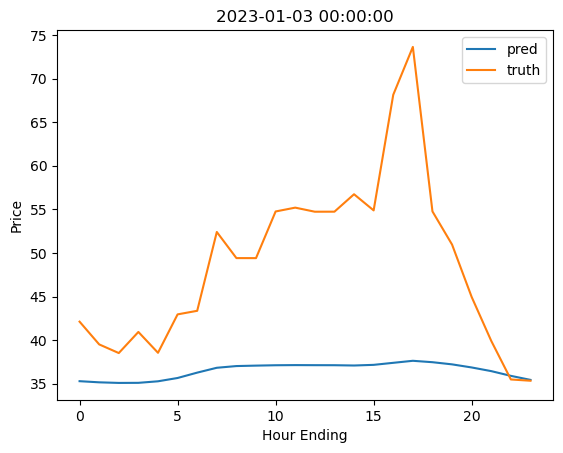

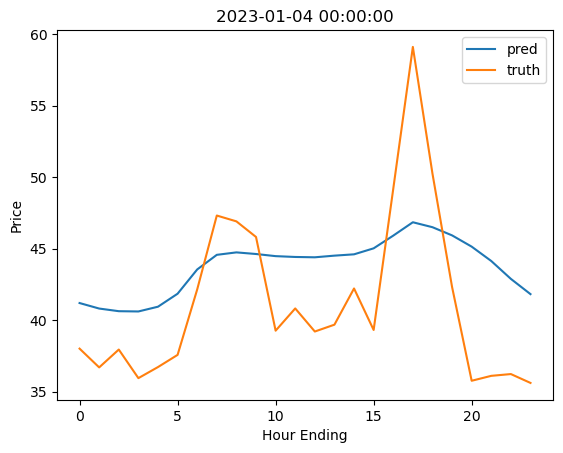

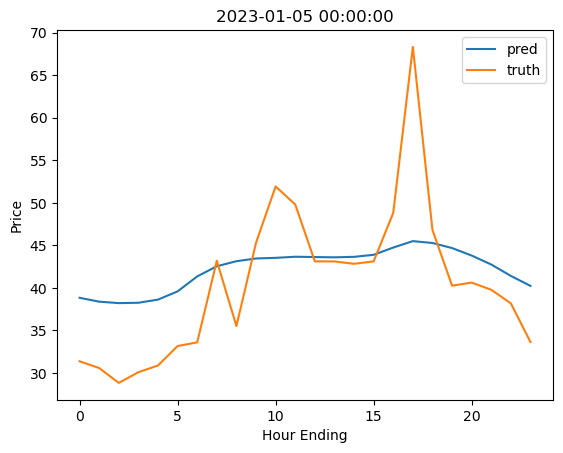

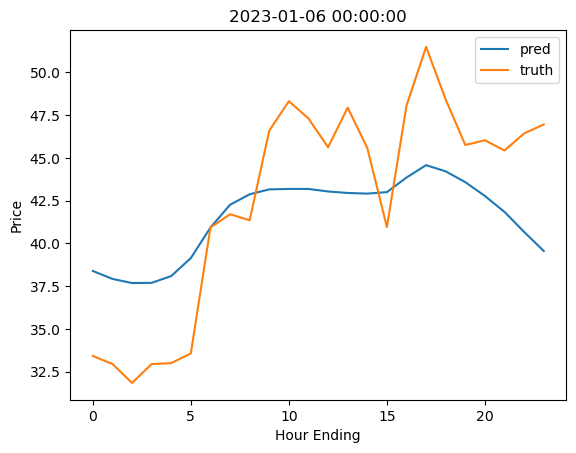

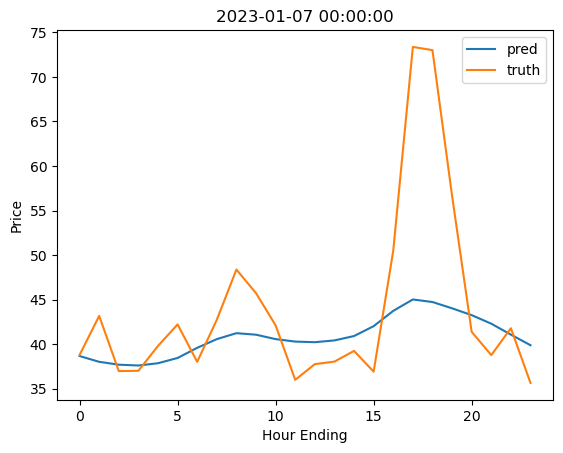

...

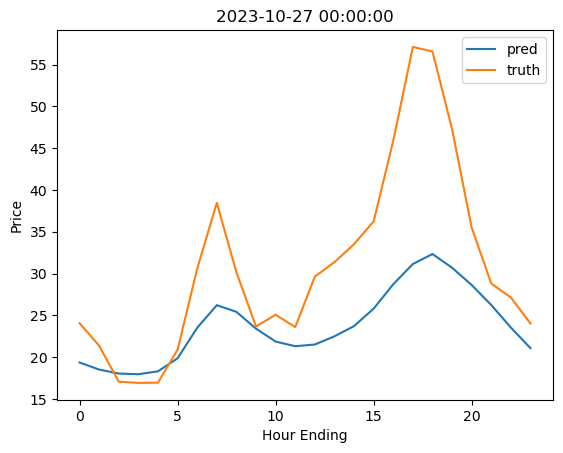

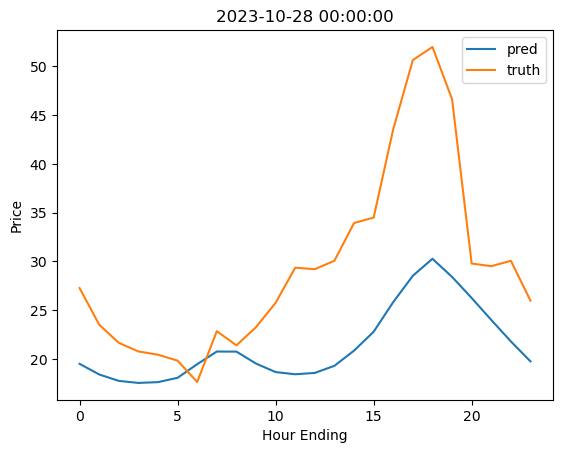

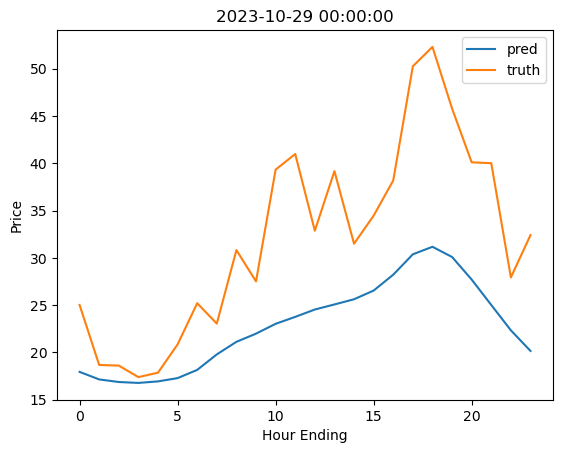

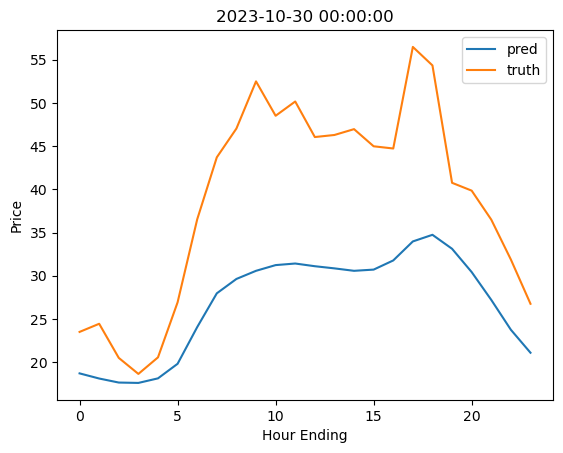

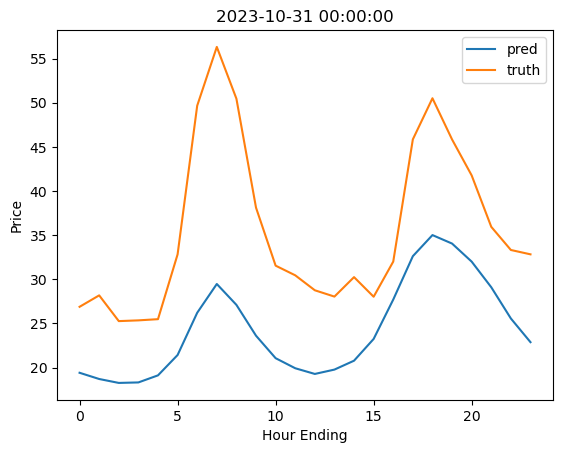

In [36]:
df_pred = pd.DataFrame([x_label, pred, truth]).T
df_pred.columns = ['Date', 'pred', 'truth']
mae_list = []
smape_list = []
for _ in range(len(df_pred)):
    plt.plot(df_pred['pred'][_], label='pred')
    plt.plot(df_pred['truth'][_], label='truth')
    plt.title(df_pred['Date'][_])
    # plt.ylim(0, 450)
    plt.xlabel('Hour Ending')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    mse, rmse, mae, smape = loss(df_pred['truth'][_], df_pred['pred'][_])
    mae_list.append(mae)
    smape_list.append(smape)
df_loss = pd.DataFrame([x_label, mae_list, smape_list]).T
df_loss.columns = ['Date', 'MAE', 'SMAPE']

In [37]:
pd.DataFrame([df_loss['MAE'].mean(), df_loss['SMAPE'].mean()])

,0
0,9.576894
1,0.210018
